## Модель заводнения на основе линий тока

Задача заводнения на нефтяном месторождении возникает в связи с необходимостью определения  доли добываемой в процессе разработки воды и нефти, распределения насыщенности водой на месторождении для корректного учета свойств флюидов в гидродинамической модели, оценки эффективности работы добывающих скважин. В частности, в процессе разработки нагнетательные скважины закачивают воду в пласт для поддержания давления в пласте. Необходимо определить, когда закачиваемая вода дойдет до добывающих скважин, обводнит их (эффективность добывающей скважины будет снижаться, так как будет падать доля добываемой нефти). 

Ниже представлен симулятор модели линий тока, построенной на основе методики, описанной в работе [3]. 
Линии тока – это траектории фильтрации жидкости в пласте. Строго говоря, Линия тока - кривая в пространстве, вдоль которой каждая точка является касательной к локальному вектору скорости [1]. В каждой точке они являются касательными к полю скоростей и перпендикулярны изобарам. Предполагается, что поле скоростей в каждом направлении координат изменяется линейно и не зависит от скоростей в других направлениях. По карте давлений определяются траектории линий и скорость течения в каждой точке. На построенных линиях тока решается уравнение насыщенности Баклея-Леверетта. Данный подход позволяют свести решение трехмерной задачи к одномерной, уменьшить трудоемкость вычислений.


## Уравнение насыщенности с граничными и начальными условиями
$$\partial S/\partial t+(\partial f({S}))/\partial\tau=\mathbf{0}$$
$$S\left(\tau=0,t\right)=S_{inj}$$
$$\left(\tau,t=0\right)=S_{init}$$

$S$ - функция водонасыщенности
$F$ - функция обводненности
$t$ - время
$tau$ - время пролета частицы
$S_{init}$ - начальная водонасыщенность


## Инструмент позволяет:
1) Строить линии тока в заданном произвольном поле давлений (от большего давления к меньшему) из заданных "пробных" точек
2) Решать уравнение насыщенности вдоль линий тока при заданных свойствах жидкости, пласта (и других параметрах), граничных условиях.
3) Визуализировать результаты построений и расчетов на карте давлений
4) Симулятор также может работать с проектом месторождения, заданным excel файлом, содержащим геометрию скважин, свойства жидкости и пласта, в таком случае учитываются именно эти параметры, а геометрия скважин отображается на карте давлений при визуализации результатов. Однако, карта давлений все еще должна задаваться пользователем с указанием месяца расчета, которому соответствует подаваемая на вход карта в рамках проекта месторождения.
5) Инструмент позволяет добалять и удалять линии тока в модель заводнения, в случае работы с проектом месторождения, есть возможность автоматически построить заданное количество линий тока от всех нагнетательных скважин месторождения.

In [24]:
from waterflooding_model import WaterfloodingModel
from map_grid import MapGrid
from data_class import InitialData
import os.path as path
import numpy as np

Задание директории с входными данными

In [15]:
updir = path.abspath(path.join(path.curdir ,"../.."))

Чтение данных проекта из excel файла (в случае, если он есть). Из файла проекта можно загрузить модель месторождения (геометрию, расположение скважин, и т.д.), но данная процедура не является обязательной для дальнейших расчетов.

project - название проекта

project_path - путь к директории с файлом проекта

In [16]:
project = 'CUD_test2'
    
project_path = updir + '\\Примеры\\Случай2\\projects\\CUD_test2'

data_project = InitialData()
data_project.load_data(project_name = project, filename = f'{project_path}/{project}.xlsx')

Загрузка поля давления из текстового файла, создание объекта класса MapGrid, визуализация карты давления.
В данном случае, карта давления в общем случае не связана с проектом конкретного месторождения.

pressure_path - путь к файлу в формате txt, содержащему грид давлений.

Пример фрагмента файла с гридом давлений:

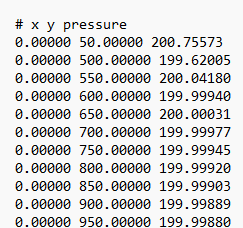

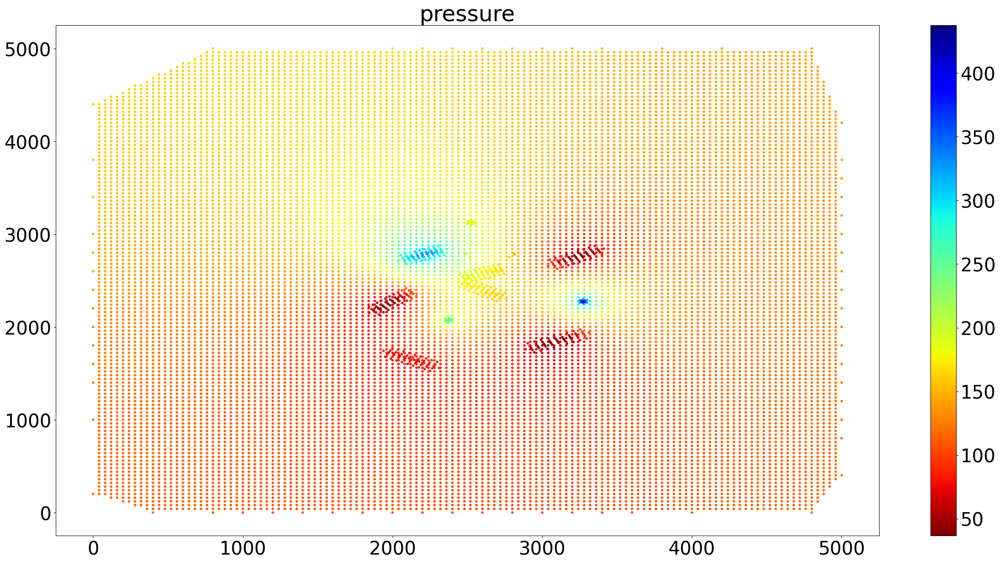

In [19]:
pressure_path = updir + '\\Примеры\\Случай2'

filename = 'CUD_test2'
filepath = f'{pressure_path}/{filename}.txt'
pressure_grid = MapGrid(filepath=filepath)
pressure_grid.plot_grid()

Создание объекта модели заводнения

In [20]:
model = WaterfloodingModel()

# Задание свойств и параметров:

initial_saturation - начальная водонасыщенность

permeability - проницаемость,МД

porosity - пористость 

water_viscosity - вязкость воды, Па*с

oil_viscosity - вязкость нефти, Па*с

dx - размер ячейки расчетной сетки, м

# Модель ОФП:
Используется модель ОФП по Кори [4]

swc - остаточная водонасыщенность

sor - остаточная нефтенасыщенность

co - степень Кори по нефти

cw - степень кори по воде

krw_max - максимальная ОФП по воде

kro_max - максимальная ОФП по нефти

ofp_params = {'swc': 0, 'sor': 0, 'co': 1, 'cw': 1, 'krw_max': 1, 'kro_max': 1}

## Загрузка параметров из словаря
Ручная загрузка в модель заданных свойств с помощью словаря (для случая, когда пользователь не работает с проектом месторождения, или при необходимости заменить описанные свойства в модели)
При загрузке визуализируются графики модели ОФП


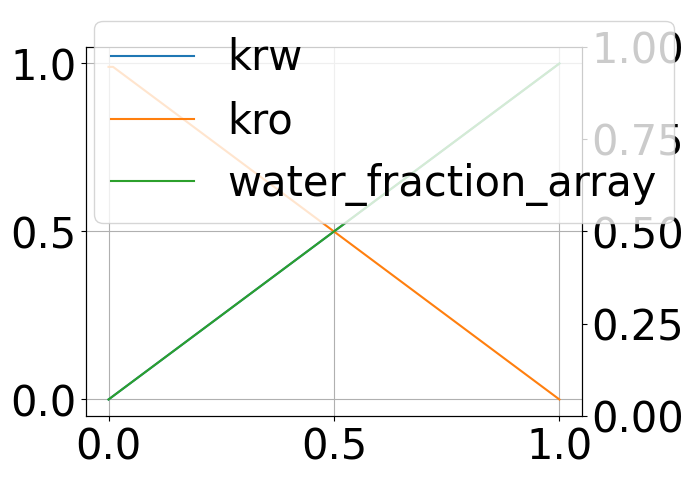

In [21]:
initial_saturation = 1e-6
permeability = 15e-15
porosity = 0.15
water_viscosity = 0.0005
oil_viscosity = 0.0005
dx = 10
ofp_params = {'swc': 0, 'sor': 0, 'co': 1, 'cw': 1, 'krw_max': 1, 'kro_max': 1}

data_dict = {'pressure_grid': pressure_grid, 'initial_saturation': initial_saturation,
                                'permeability': permeability, 'porosity': porosity,
                                'water_viscosity': water_viscosity,
                                 'oil_viscosity': oil_viscosity, 'ofp_params': ofp_params}

model.load_data_from_dict(data_dict, dx)


## Загрузка параметров из проекта месторождения
Загрузка данных месторождения из проекта.

Из файла проекта загружаются следующие параметры:

1) П проницаемость,Д2) П - пористс3) Вty - вязкость воды 4) Вsity - вязкость неф
5) Модель ОФП (на основе таблицы)

При загрузке пользователем вручную указывается:
1) dx - значение шага по расчетной сетке, м
2) initial_saturation - значение начальной насыщенности
3) project_path - путь к директории с файлом проекта
4) month - номер месяца из числа месяцев, для которых есть данные в файле проекта (для отображения актуального состояния скважин)

## Важно:

Для загрузки данных проекта необходимо наличие файла в формате txt с гридом давлений (в том же формате, который описан выше). его название должно соответствовать названию проекта (переменная project) с постфиксом _{номер месяца}. Например: CUD_test2_180.txt для файла проекта CUD_test2.xlsx, для 180го месяца в модели.
и, Па*с

При загрузке визуализируются графики модели ОФП и поле давлений

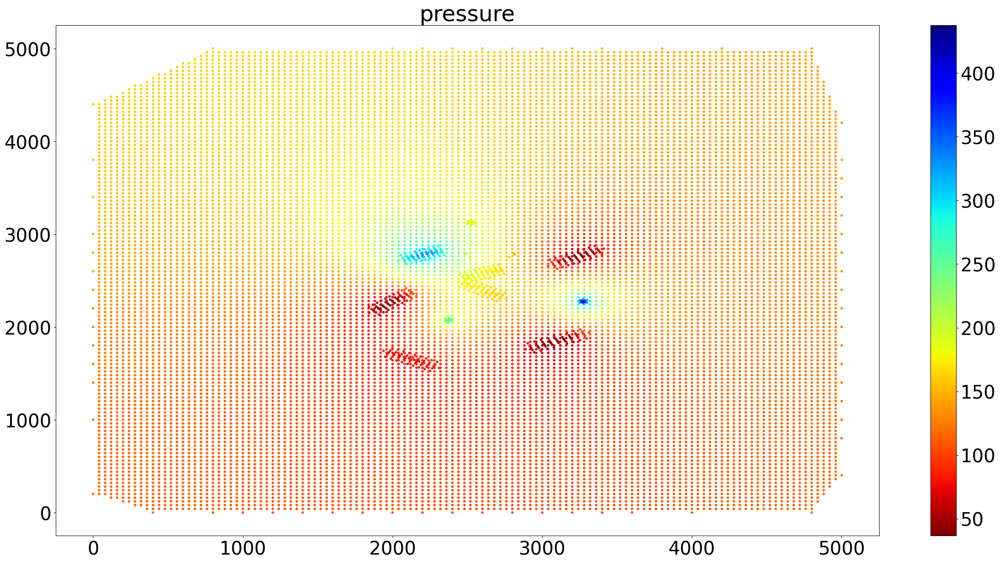

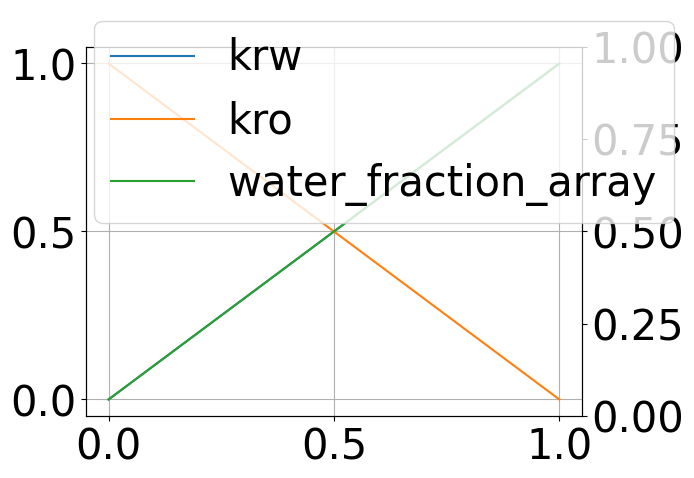

In [22]:
initial_saturation = 1e-6
dx = 10
month = 180
model.load_data_from_project(data_project, dx, initial_saturation, project_path, month)

## Создание и построение линии тока с началом в заданной точке (x,y)

1) Построение линий тока основано на алгоритме, описанном Поллоком [2]

2) Основное предположение - поле скоростей в каждом координатном направлении изменяется линейно и не зависит от скоростей в других направлениях

3) Метод Поллока согласуется с основным уравнение материального баланса

4) На каждом шаге алгоритма построения одной линии тока определяется положение и параметры следующего узла, пока не будет выполнен критерий остановки
   
5) Линии тока строятся от большего давления к меньшему 

## Критерии остановки: 
1) Среди соседних ячеек нет ячейки с давлением, меньшим, чем текущее

2) Линия тока достигает добывающей скважины или границы

## Определение поля скоростей
После определения поля давлений определяется поле векторов скоростей для определения траектории линий тока.
Закон Дарси примененный между двумя узлами сетки давления выражает суммарную скорость на границе ячейки.

$$u_{t,i}=\frac{{(\frac{k_{ro}(S_i)}{\mu_o}\ +\ \frac{k_{rw}(S_i)}{\mu_w})\ k}_i}{A\varphi}\left(P_{i+1}-P_i\right)$$
$k_{ro}\left(S\right)$ - относительная фазовая проницаемость (ОФП) нефти
$k_{rw}\left(S\right)$ - относительная фазовая проницаемость (ОФП) воды
$\mu_o$ - вязкость нефи
$\mu_o$ - вязкость воды
$k_i$ - абсолютная проницаемость в ячейке i
$S_i$ - текущая насыщенность (вычисленная на прошлом шаге по времени или начальная) в ячейке i
$P_i$ - давление в ячейкеi
$A$ - длина грани ячейке
$\varphi$ - пористось



## Время пролета
Время полета $𝜏$ - это время, необходимое частице для достижения расстояния s вдоль линии тока при скоростях, действующей вдоль линии тока

$$\tau= \sum_{i=1}^{n}∆ti$$
$∆ti$ - время пролета частицы через ячейку 𝑖


Задание координат начальных точек для линий тока. Создание (и автоматическое построение) линий тока.
Каждой линии тока присваивается заданный id streamline_id.


In [40]:
x = np.array([3275., 2375., 2525.])
y = np.array([2275., 2075., 3125.])   

for i in range(len(x)):
    streamline = model.add_streamline(streamline_id = i,                              
                                  x_init = x[i], y_init = y[i])
    
    #streamline.plot_trajectory()

Задание времени работы линии тока working_time (в секундах) и решение уравнения насыщенности вдоль линии тока при заданном граничном условии на водонасыщенность (water_saturation_injection) в первой точке (с наибольшим для данной линии тока давлением).


In [41]:

for i in range(len(x)):

    working_time = 2592000*12
    water_saturation_injection = 1
    result = streamline.solve(working_time, water_saturation_injection = water_saturation_injection)
       
    # streamline.plot_trajectory()

In [ ]:
Визуализация результатов

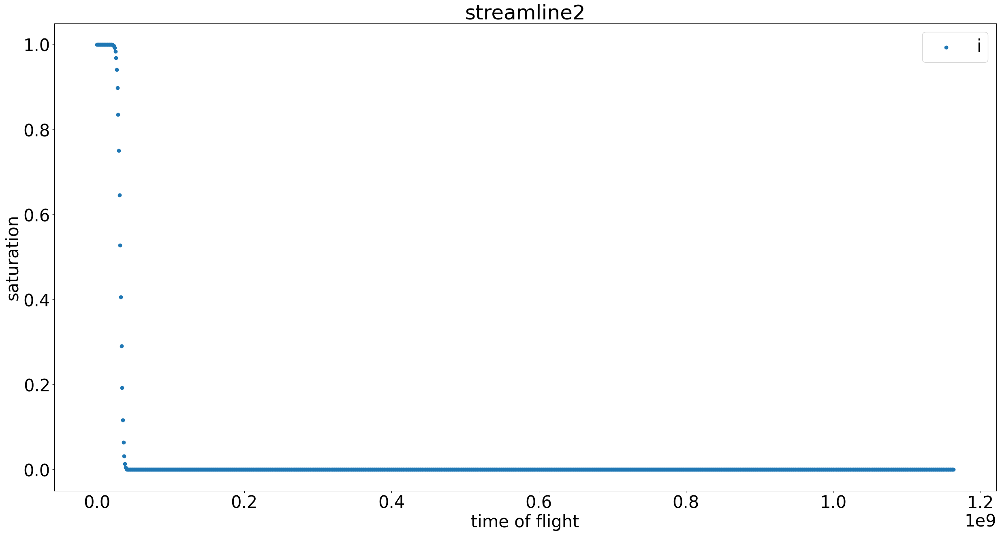

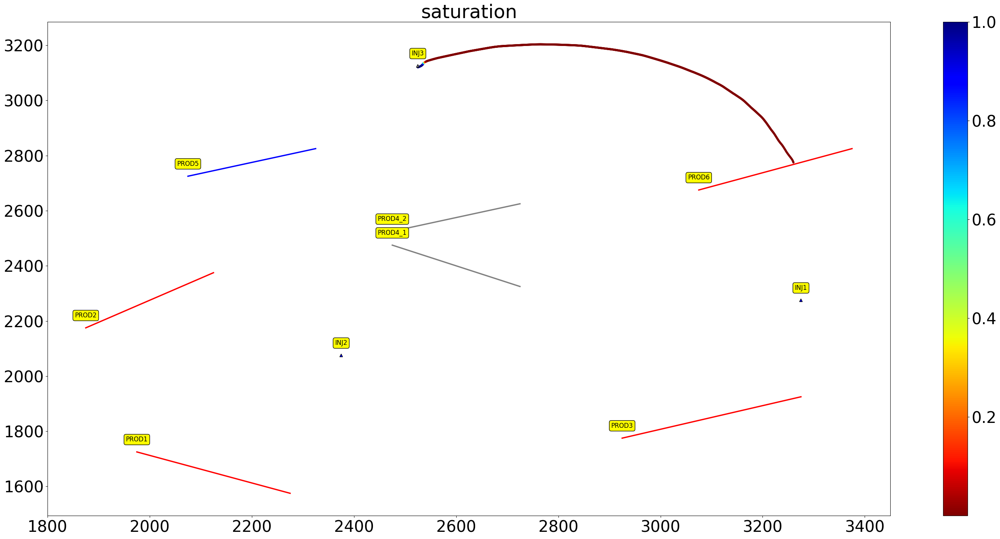

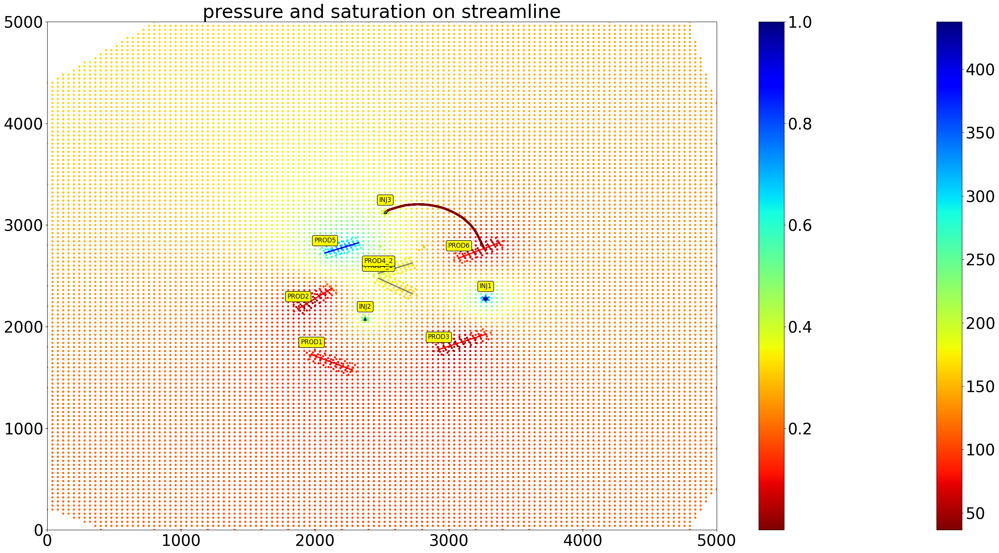

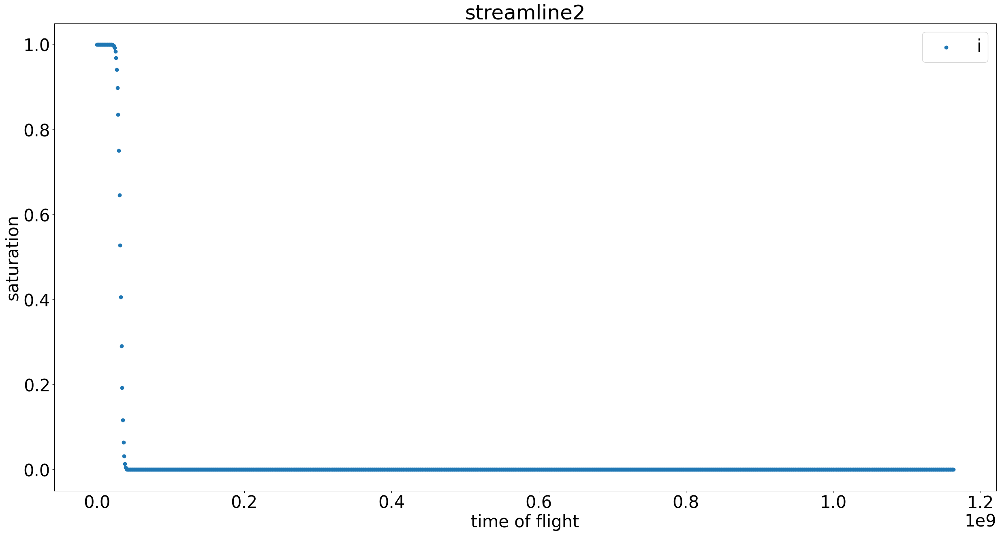

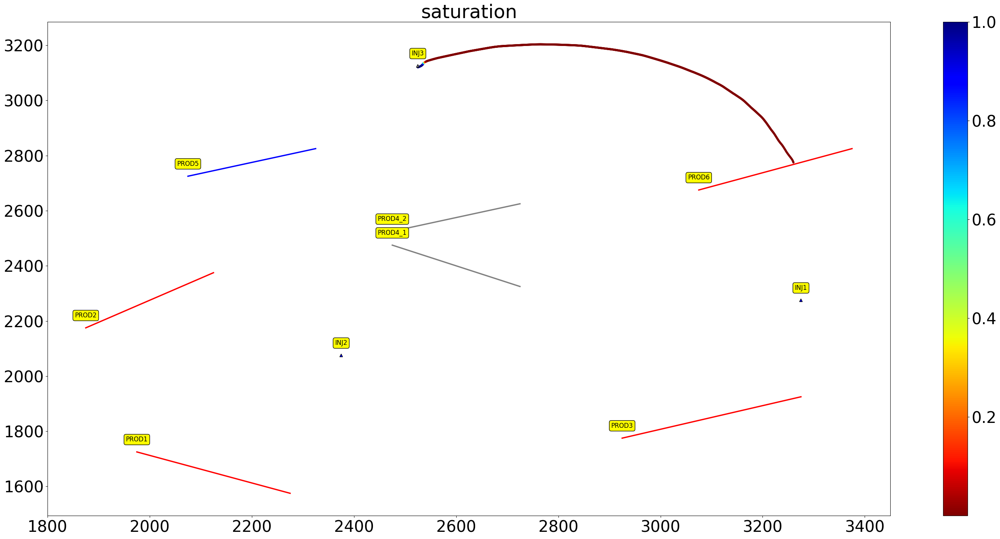

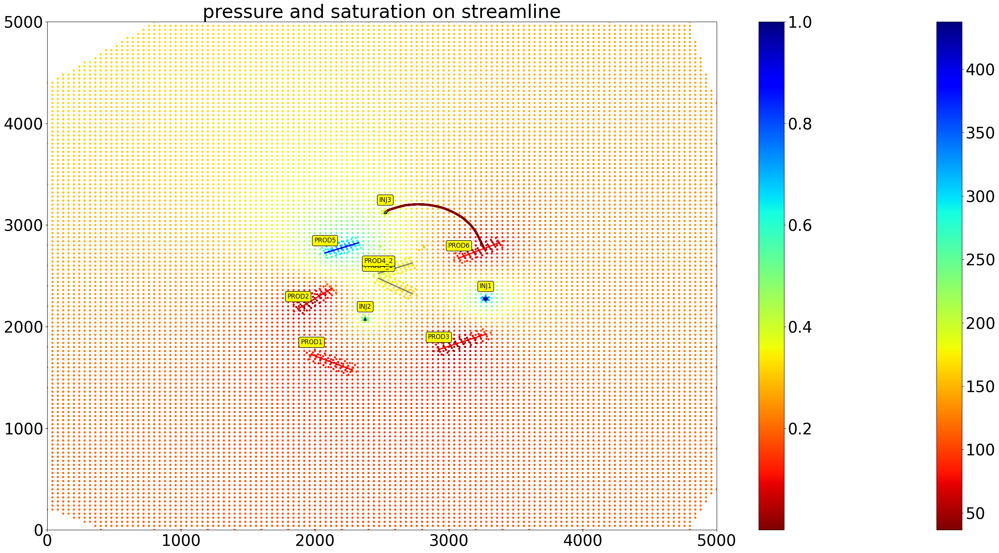

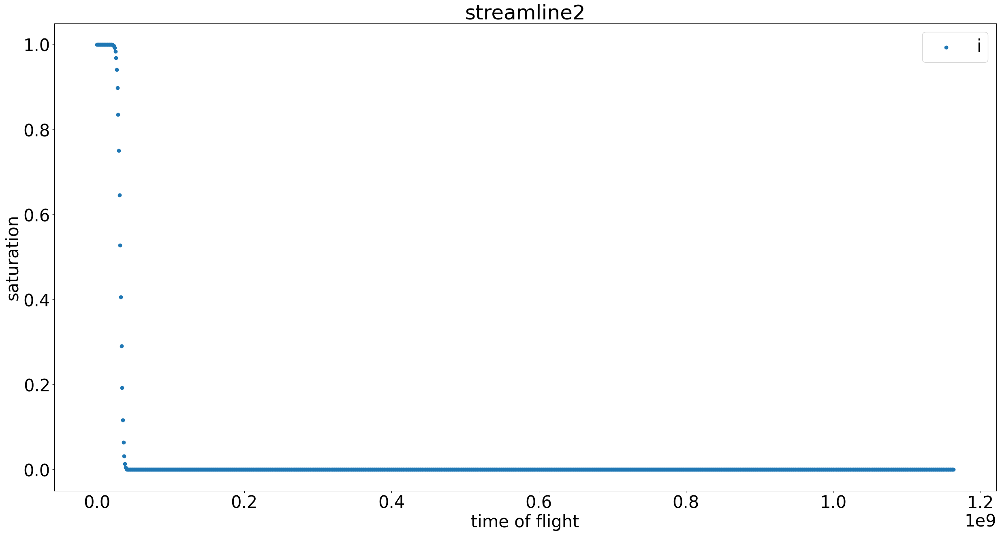

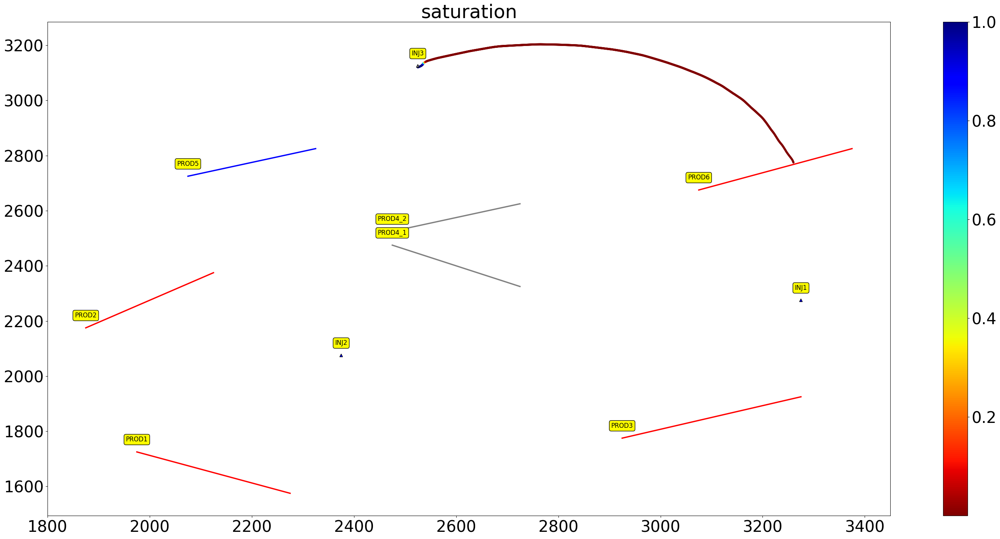

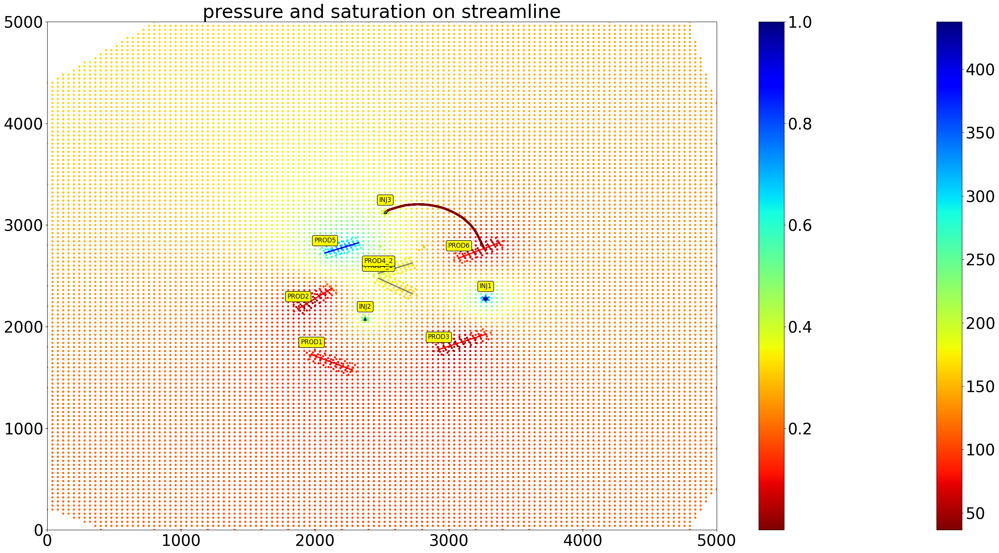

In [42]:
for i in range(len(x)):
    streamline.plot_results()
    
    # streamline.plot_trajectory()

Удаление линии тока с индексом 0 из модели

In [27]:
model.clear_streamline(streamline_id = 0)

Удаление всех созданных линии тока из модели

In [28]:
model.clear_all_streamlines()

Постоение линий тока от всех нагнетательных скважин месторождения (если загружены данные из проекта с месторождением)

n_lines - количество линий тока на ячейку (соответствует количеству линий тока от вертикальной скважины, для ГРП, или горизонтальной скважины пересчитывается в зависимости от длины скважины и шага расчетной сетки)

Задание времени работы линии тока working_time (в секундах) и решение уравнения насыщенности вдоль линии тока при заданном граничном условии на водонасыщенность (water_saturation_injection) в первой точке (с наибольшим для данной линии тока давлением).


In [31]:
n_lines = 10
working_time = 2592000*12
water_saturation_injection = 1
model.trace_streamlines_from_wells(n_lines, working_time, water_saturation_injection)

Визуализация результатов

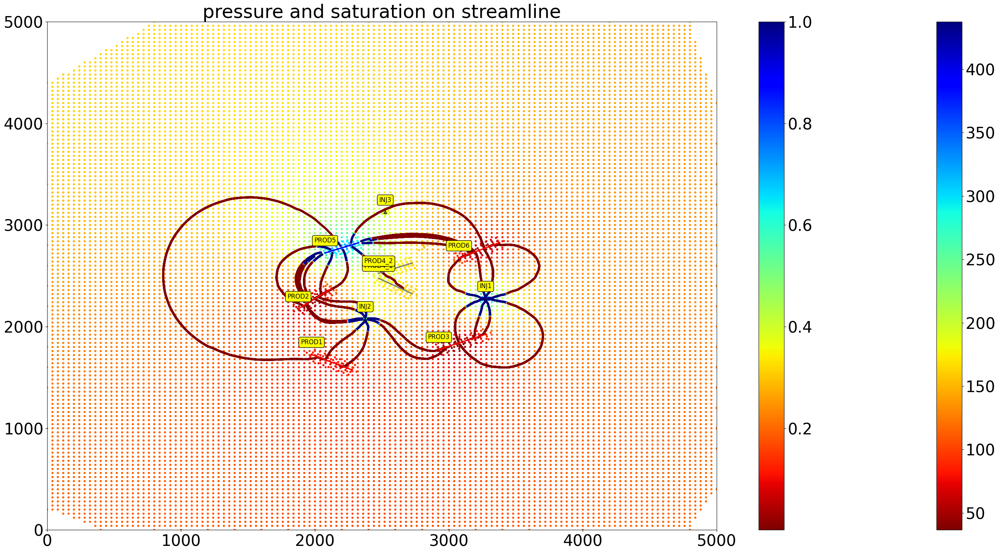

In [32]:
model.plot_results()
    

## Источники

[1] Bear, J.: “Dynamics of Fluids in Porous Media”
, American Elsevier, New York
(1972).

[2] Pollock, D.W.: “Semianalytical Computation of Path Lines for Finite-Dierence Models Ground Water ”
(November-December 1988) 26, No. 6, 743750.

[3] Batycky R.P.: “ A three-dimensional two-phase field scale streamline simulator”
, Stanford University
(1997).

[4] A. A. Rybakovskaya, I. V. Fakhretdinov, A. A. Prokhorov et al.. Automation of the forecasting process for wells base production.
(2021).

